In [1]:
import os
import numpy as np
import pandas as pd
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torchvision import  transforms
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import functional as TF
from PIL import Image
import matplotlib.pyplot as plt
import random
from tqdm import tqdm
from typing import List,Tuple,Optional
import albumentations as A
from albumentations.pytorch import ToTensorV2
import warnings
warnings.filterwarnings('ignore')
import wandb
import cv2
from typing import Tuple, Optional, List
import albumentations as A
from albumentations.pytorch import ToTensorV2
import tifffile


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
torch.cuda.is_available()

True

In [4]:
DATA_DIR = "/content/drive/MyDrive/massh/data/tiff/"

x_train_dir = os.path.join(DATA_DIR, 'train')
y_train_dir = os.path.join(DATA_DIR, 'train_labels')

x_valid_dir = os.path.join(DATA_DIR, 'val')
y_valid_dir = os.path.join(DATA_DIR, 'val_labels')

x_test_dir = os.path.join(DATA_DIR, 'test')#/content/drive/MyDrive/massachusetts_building_data/data/tiff/Clustered_buildings
y_test_dir = os.path.join(DATA_DIR, 'test_labels')#/content/drive/MyDrive/massachusetts_building_data/data/tiff/Clustered_buildings_label

In [5]:
# Useful to shortlist specific classes in datasets with large number of classes
class_names = ['background', 'building']
select_classes=class_names
class_rgb_values= [[0, 0, 0], [255, 255, 255]]

# Get RGB values of required classes
select_class_indices = [class_names.index(cls.lower()) for cls in select_classes]
select_class_rgb_values =  np.array(class_rgb_values)[select_class_indices]

print('Selected classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

Selected classes and their corresponding RGB values in labels:
Class Names:  ['background', 'building']
Class RGB values:  [[0, 0, 0], [255, 255, 255]]


In [6]:


img_train_dir = x_train_dir
gts_train_dir = y_test_dir

img_val_dir = x_valid_dir
gts_val_dir = y_valid_dir

img_test_dir = x_test_dir
gts_test_dir = y_test_dir

In [7]:
img_train_paths = [os.path.join(img_train_dir, image_id) for image_id in sorted(os.listdir(img_train_dir))]
gts_train_paths = [os.path.join(gts_train_dir, image_id) for image_id in sorted(os.listdir(gts_train_dir))]

img_val_paths = [os.path.join(img_val_dir, image_id) for image_id in sorted(os.listdir(img_val_dir))]
gts_val_paths = [os.path.join(gts_val_dir, image_id) for image_id in sorted(os.listdir(gts_val_dir))]

img_test_paths = [os.path.join(img_test_dir, image_id) for image_id in sorted(os.listdir(img_test_dir))]
gts_test_paths = [os.path.join(gts_test_dir, image_id) for image_id in sorted(os.listdir(gts_test_dir))]

In [8]:
print(len(img_train_paths), len(gts_train_paths))
print(img_train_paths[5], gts_train_paths[5])

print(len(img_val_paths), len(gts_val_paths))
print(img_val_paths[2], gts_val_paths[2])

print(len(img_test_paths), len(gts_test_paths))
print(img_test_paths[1], gts_test_paths[1])

137 10
/content/drive/MyDrive/massh/data/tiff/train/22678990_15.tiff /content/drive/MyDrive/massh/data/tiff/test_labels/23578960_15.tif
4 4
/content/drive/MyDrive/massh/data/tiff/val/23579050_15.tiff /content/drive/MyDrive/massh/data/tiff/val_labels/23579050_15.tif
10 10
/content/drive/MyDrive/massh/data/tiff/test/22828990_15.tiff /content/drive/MyDrive/massh/data/tiff/test_labels/22828990_15.tif


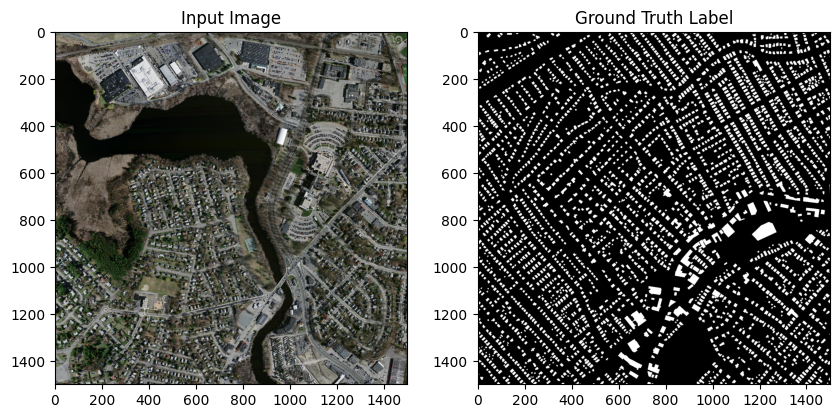

In [9]:

image = Image.open(img_train_paths[0])
label = Image.open(gts_train_paths[0])

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Input Image")
plt.imshow(image)

plt.subplot(1, 2, 2)
plt.title("Ground Truth Label")
plt.imshow(label, cmap='gray')
plt.show()


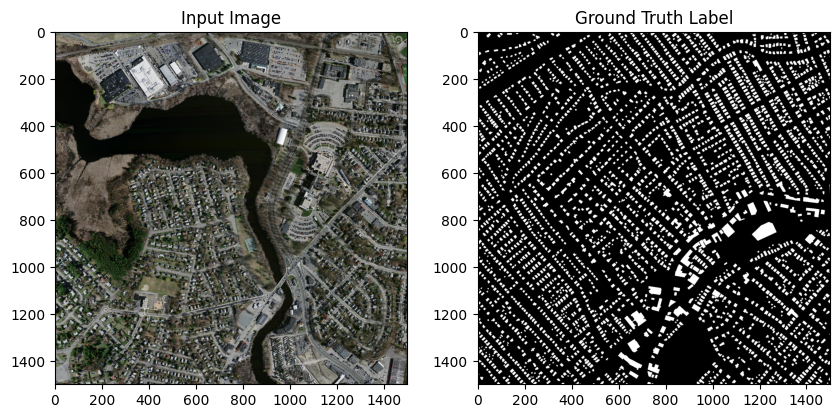

Successfully loaded batch:
Image batch shape: torch.Size([4, 3, 512, 512])
Mask batch shape: torch.Size([4, 512, 512])
Visualizing dataset...


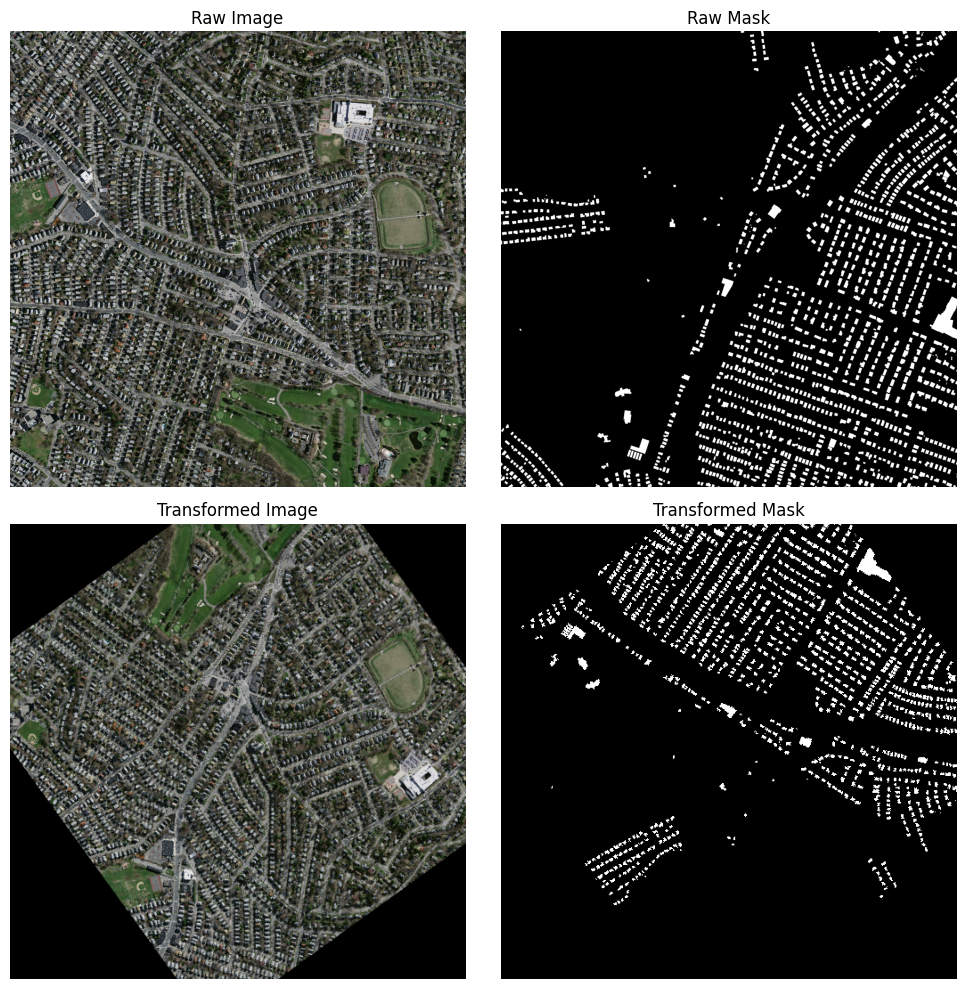

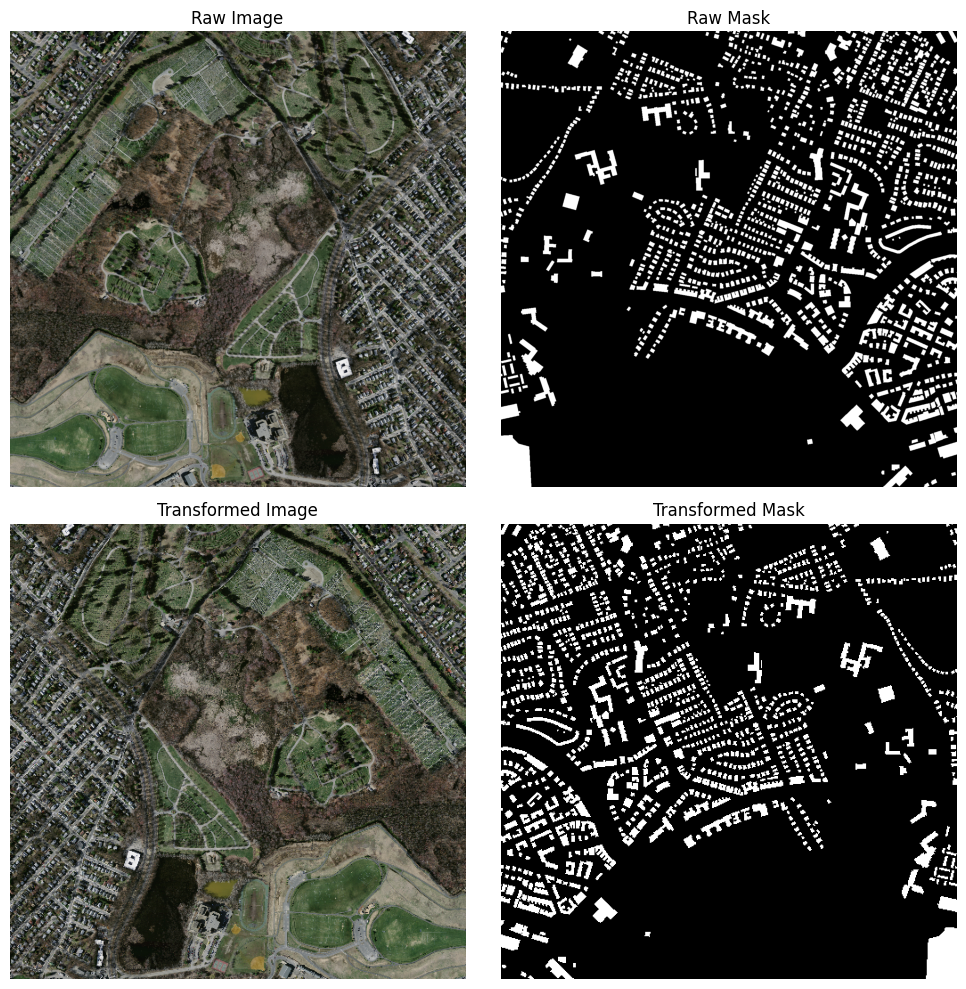

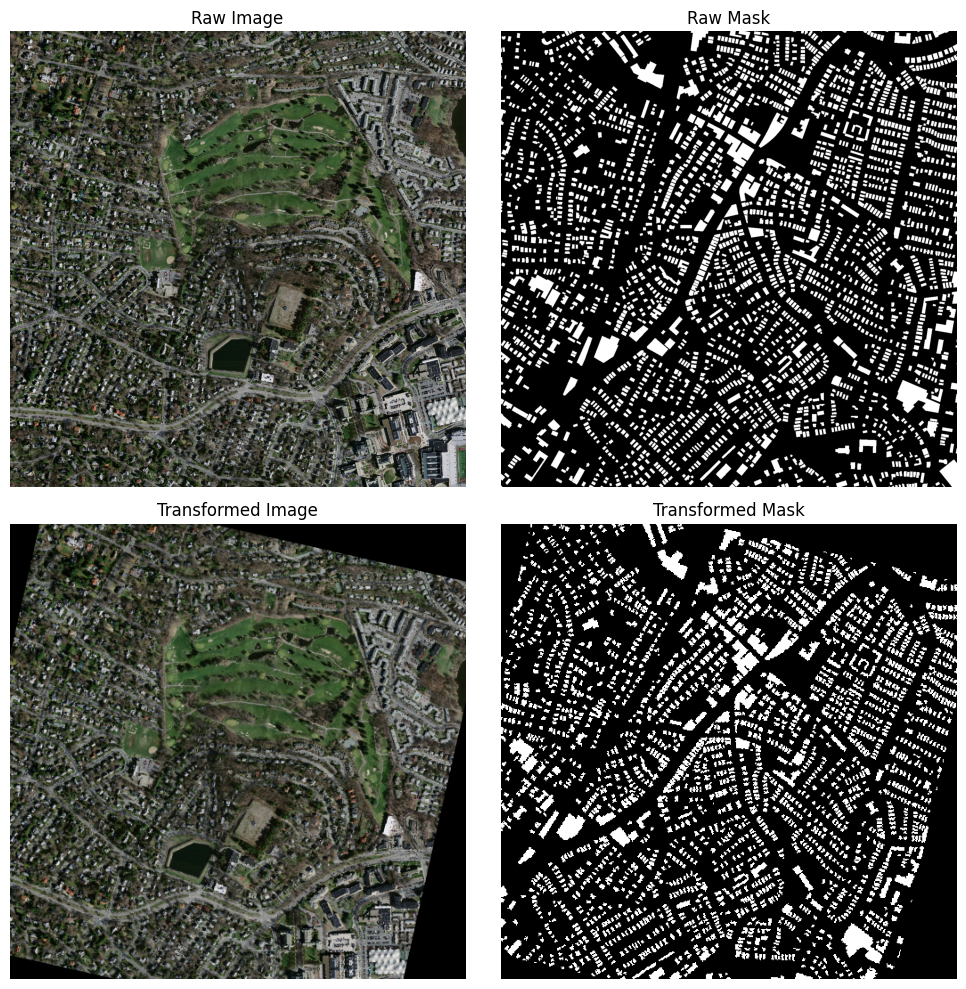

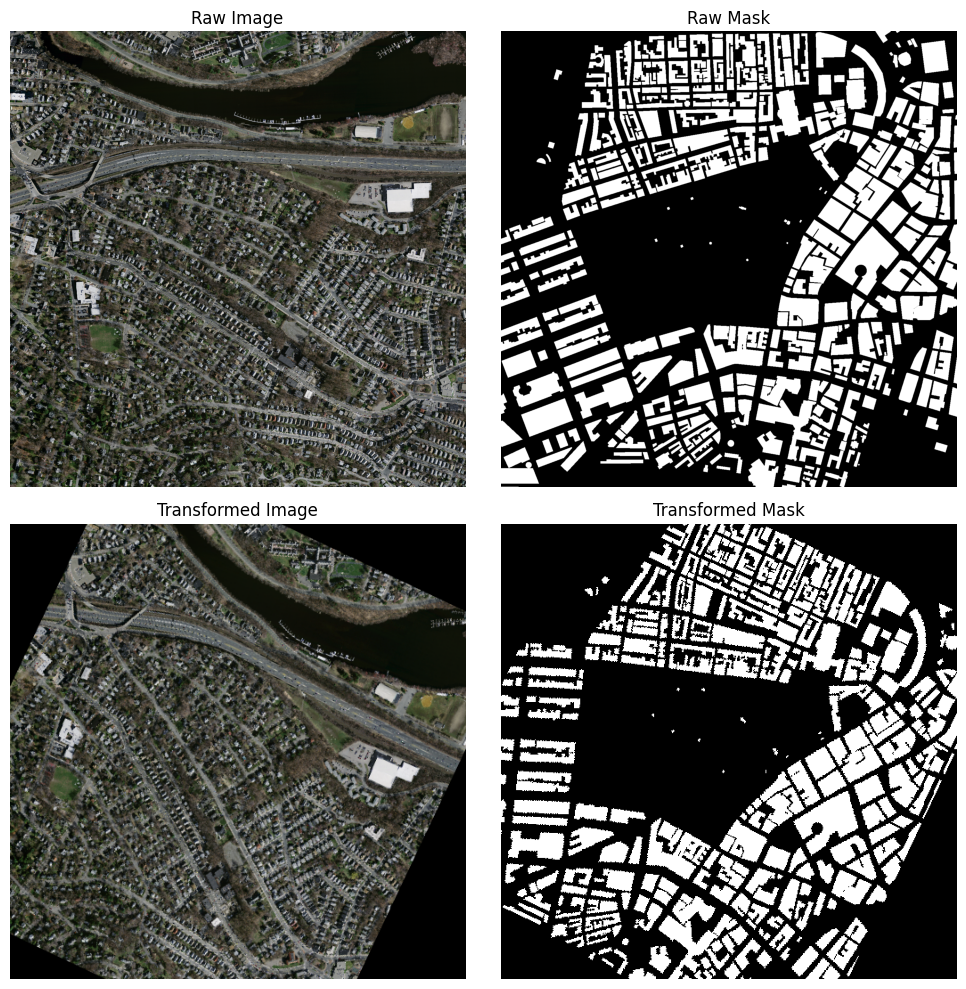

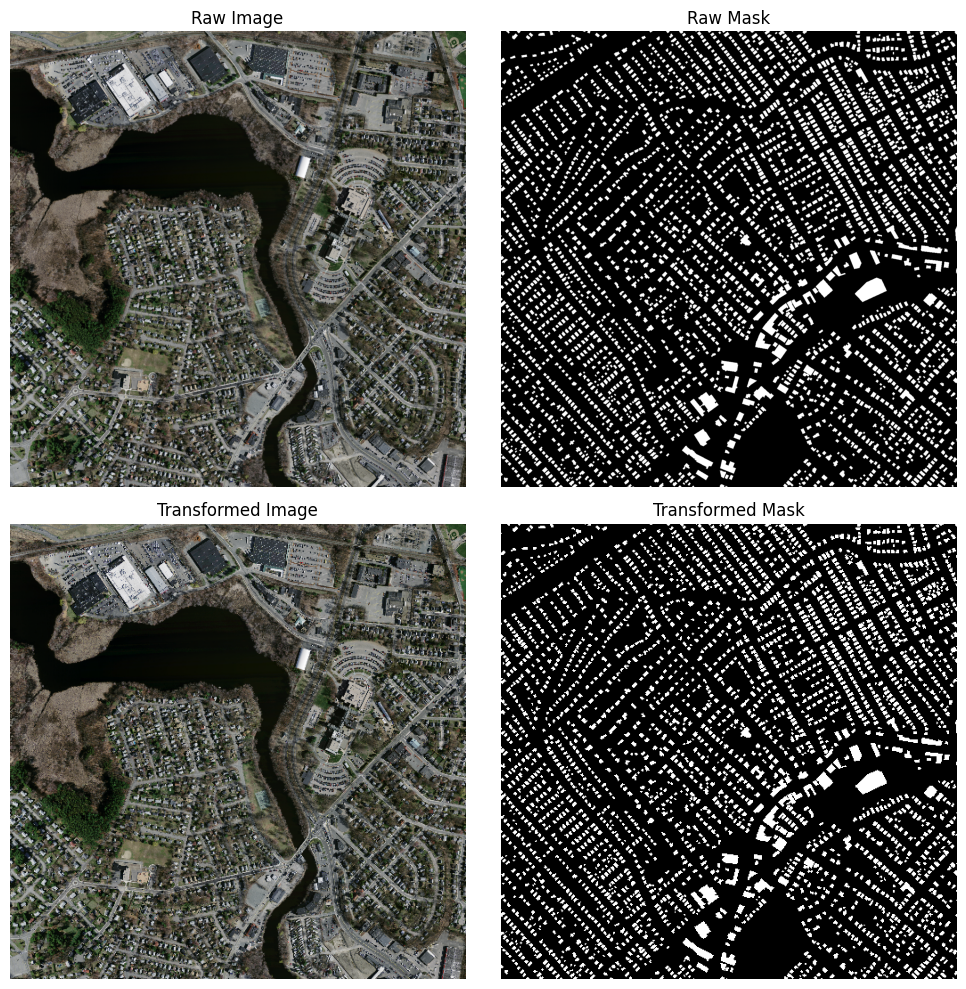

Summary for Training Set:
Exploring Dataset Summary...
Total Samples: 137


  7%|▋         | 10/137 [00:02<00:29,  4.26it/s]



Image Shape Statistics:
- Min Dimensions: [1500 1500]
- Max Dimensions: [1500 1500]
- Mean Dimensions: [1500. 1500.]

Mask Shape Statistics:
- Min Dimensions: [1500 1500]
- Max Dimensions: [1500 1500]
- Mean Dimensions: [1500. 1500.]

Building Pixel Statistics:
- Total Building Pixels: 4186488
- Mean Building Pixels per Mask: 418648.8
- Median Building Pixels per Mask: 351665.0
- Building Pixel Coverage (%): 18.61

Visualizing Overlayed Masks for Training Set:
Error visualizing sample 51: list index out of range
Error visualizing sample 106: list index out of range
Error visualizing sample 66: list index out of range
Error visualizing sample 42: list index out of range
Error visualizing sample 119: list index out of range


In [10]:
image = Image.open(img_train_paths[0])
label = Image.open(gts_train_paths[0])

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Input Image")
plt.imshow(image)

plt.subplot(1, 2, 2)
plt.title("Ground Truth Label")
plt.imshow(label, cmap='gray')
plt.show()

class MassachusettsBuildingsDataset(Dataset):
    """
    Dataset class for Massachusetts Buildings Dataset with improved error handling
    """
    def __init__(
        self,
        image_paths: List[str],
        mask_paths: List[str],
        image_size: Tuple[int, int] = (512, 512),
        transform: Optional[A.Compose] = None,
        preprocessing: Optional[A.Compose] = None,
    ):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.image_size = image_size
        self.transform = transform
        self.preprocessing = preprocessing

        # Validate paths and remove invalid pairs
        self.image_paths, self.mask_paths = self._validate_paths()

        if len(self.image_paths) == 0:
            raise RuntimeError("No valid image-mask pairs found")

    def _validate_paths(self) -> Tuple[List[str], List[str]]:
        """Validate and filter paths, returning only valid pairs"""
        valid_img_paths = []
        valid_mask_paths = []

        for img_path, mask_path in zip(self.image_paths, self.mask_paths):
            if os.path.exists(img_path) and os.path.exists(mask_path):
                try:
                    # Try to open both files to ensure they're valid
                    with Image.open(img_path) as img:
                        img_size = img.size
                    with Image.open(mask_path) as mask:
                        mask_size = mask.size

                    # Check if sizes match
                    if img_size == mask_size:
                        valid_img_paths.append(img_path)
                        valid_mask_paths.append(mask_path)
                except Exception as e:
                    print(f"Error loading {img_path} or {mask_path}: {str(e)}")
                    continue

        return valid_img_paths, valid_mask_paths

    def __len__(self) -> int:
        return len(self.image_paths)

    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, torch.Tensor]:
        try:
            # Load image
            image = self._load_image(self.image_paths[idx])
            mask = self._load_mask(self.mask_paths[idx])

            # Ensure images are the right size
            image, mask = self._resize_if_needed(image, mask)

            # Apply transformations
            if self.transform is not None:
                transformed = self.transform(image=image, mask=mask)
                image = transformed['image']
                mask = transformed['mask']

            # Apply preprocessing
            if self.preprocessing is not None:
                preprocessed = self.preprocessing(image=image, mask=mask)
                image = preprocessed['image']
                mask = preprocessed['mask']

            # Final checks
            if torch.is_tensor(image):
                image = image.float()
            if torch.is_tensor(mask):
                mask = mask.float()

            return image, mask

        except Exception as e:
            print(f"Error processing index {idx}: {str(e)}")
            # Return a zero tensor of the correct shape as a fallback
            return (torch.zeros((3, *self.image_size)),
                   torch.zeros(self.image_size))

    def _load_image(self, path: str) -> np.ndarray:
        """Safely load an image"""
        try:
            image = cv2.imread(path)
            if image is None:
                raise ValueError(f"Failed to load image: {path}")
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            return image
        except Exception as e:
            raise ValueError(f"Error loading image {path}: {str(e)}")

    def _load_mask(self, path: str) -> np.ndarray:
        """Safely load a mask"""
        try:
            mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
            if mask is None:
                raise ValueError(f"Failed to load mask: {path}")
            mask = (mask > 0).astype(np.float32)
            return mask
        except Exception as e:
            raise ValueError(f"Error loading mask {path}: {str(e)}")

    def _resize_if_needed(self, image: np.ndarray, mask: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
        """Resize image and mask if they don't match the target size"""
        if image.shape[:2] != self.image_size:
            image = cv2.resize(image, self.image_size[::-1], interpolation=cv2.INTER_LINEAR)
            mask = cv2.resize(mask, self.image_size[::-1], interpolation=cv2.INTER_NEAREST)
            mask = (mask > 0.5).astype(np.float32)
        return image, mask

def get_preprocessing() -> A.Compose:
    """Get preprocessing transforms"""
    return A.Compose([
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2(),
    ])

def get_transforms(image_size: Tuple[int, int], is_training: bool = True) -> A.Compose:
    """Get transforms for training or validation"""
    if is_training:
        return A.Compose([
            A.Resize(height=image_size[0], width=image_size[1]),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
            A.ShiftScaleRotate(
                shift_limit=0.0625,
                scale_limit=0.1,
                rotate_limit=45,
                p=0.5,
                border_mode=cv2.BORDER_CONSTANT
            )
        ])
    else:
        return A.Compose([
            A.Resize(height=image_size[0], width=image_size[1])
        ])

def create_dataloaders(
    img_train_paths: List[str],
    gts_train_paths: List[str],
    img_val_paths: List[str],
    gts_val_paths: List[str],
    image_size: Tuple[int, int] = (512, 512),
    batch_size: int = 4,
    num_workers: int = 0  # Set to 0 for debugging
) -> Tuple[DataLoader, DataLoader]:
    """Create training and validation dataloaders with error handling"""

    try:
        # Create datasets
        train_dataset = MassachusettsBuildingsDataset(
            image_paths=img_train_paths,
            mask_paths=gts_train_paths,
            image_size=image_size,
            transform=get_transforms(image_size, is_training=True),
            preprocessing=get_preprocessing()
        )

        val_dataset = MassachusettsBuildingsDataset(
            image_paths=img_val_paths,
            mask_paths=gts_val_paths,
            image_size=image_size,
            transform=get_transforms(image_size, is_training=False),
            preprocessing=get_preprocessing()
        )

        # Create dataloaders with error handling
        train_loader = DataLoader(
            train_dataset,
            batch_size=batch_size,
            shuffle=True,
            num_workers=num_workers,
            pin_memory=True if torch.cuda.is_available() else False,
            persistent_workers=True if num_workers > 0 else False,
            drop_last=True,
        )

        val_loader = DataLoader(
            val_dataset,
            batch_size=batch_size,
            shuffle=False,
            num_workers=num_workers,
            pin_memory=True if torch.cuda.is_available() else False,
            persistent_workers=True if num_workers > 0 else False,
        )

        return train_loader, val_loader

    except Exception as e:
        print(f"Error creating dataloaders: {str(e)}")
        raise


if __name__ == "__main__":
    # Test the dataloaders with error handling
    try:
        # Create dataloaders with num_workers=0 for debugging
        train_loader, val_loader = create_dataloaders(
            img_train_paths=img_train_paths,
            gts_train_paths=gts_train_paths,
            img_val_paths=img_val_paths,
            gts_val_paths=gts_val_paths,
            image_size=(512, 512),
            batch_size=4,
            num_workers=0  # Set to 0 for debugging
        )

        # Test loading a batch
        for images, masks in train_loader:
            print(f"Successfully loaded batch:")
            print(f"Image batch shape: {images.shape}")
            print(f"Mask batch shape: {masks.shape}")
            break

    except Exception as e:
        print(f"Error in main execution: {str(e)}")

def visualize_transformed_dataset(
    dataset: MassachusettsBuildingsDataset,
    num_samples: int = 5
) -> None:
    """
    Visualize raw and transformed samples from the dataset.

    Args:
        dataset (MassachusettsBuildingsDataset): Dataset to visualize.
        num_samples (int): Number of samples to visualize.
    """
    # Select random indices to visualize
    indices = random.sample(range(len(dataset)), num_samples)

    for idx in indices:
        try:
            # Get raw image and mask
            raw_image = cv2.imread(dataset.image_paths[idx])
            raw_image = cv2.cvtColor(raw_image, cv2.COLOR_BGR2RGB)
            raw_mask = cv2.imread(dataset.mask_paths[idx], cv2.IMREAD_GRAYSCALE)

            # Get transformed image and mask
            transformed_image, transformed_mask = dataset[idx]

            # Denormalize the transformed image for visualization
            transformed_image = TF.normalize(
                transformed_image,
                mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
                std=[1 / 0.229, 1 / 0.224, 1 / 0.225]
            ).permute(1, 2, 0).numpy()

            # Convert tensors to numpy arrays
            transformed_image = (transformed_image * 255).astype(np.uint8)
            transformed_mask = transformed_mask.numpy()

            # Plot original and transformed images
            fig, axs = plt.subplots(2, 2, figsize=(10, 10))

            axs[0, 0].imshow(raw_image)
            axs[0, 0].set_title("Raw Image")
            axs[0, 0].axis("off")

            axs[0, 1].imshow(raw_mask, cmap="gray")
            axs[0, 1].set_title("Raw Mask")
            axs[0, 1].axis("off")

            axs[1, 0].imshow(transformed_image)
            axs[1, 0].set_title("Transformed Image")
            axs[1, 0].axis("off")

            axs[1, 1].imshow(transformed_mask, cmap="gray")
            axs[1, 1].set_title("Transformed Mask")
            axs[1, 1].axis("off")

            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"Error visualizing sample {idx}: {str(e)}")



if __name__ == "__main__":
    # Load the training dataset for visualization
    train_dataset = MassachusettsBuildingsDataset(
        image_paths=img_train_paths,
        mask_paths=gts_train_paths,
        image_size=(512, 512),
        transform=get_transforms(image_size=(512, 512), is_training=True),
        preprocessing=get_preprocessing(),
    )

    print("Visualizing dataset...")
    visualize_transformed_dataset(train_dataset, num_samples=5)

def dataset_summary(image_paths: List[str], mask_paths: List[str]) -> None:
    """
    Summarize key statistics about the dataset.

    Args:
        image_paths (List[str]): Paths to the dataset images.
        mask_paths (List[str]): Paths to the dataset masks.
    """
    print("Exploring Dataset Summary...")
    num_samples = len(image_paths)
    print(f"Total Samples: {num_samples}")

    # Variables to collect statistics
    image_shapes = []
    mask_shapes = []
    building_pixel_counts = []
    total_pixel_counts = []

    for img_path, mask_path in tqdm(zip(image_paths, mask_paths), total=num_samples):
        # Load image and mask
        try:
            image = cv2.imread(img_path)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

            # Image and mask shapes
            image_shapes.append(image.shape[:2])
            mask_shapes.append(mask.shape)

            # Building pixel statistics
            building_pixels = np.sum(mask > 0)
            total_pixels = mask.size
            building_pixel_counts.append(building_pixels)
            total_pixel_counts.append(total_pixels)

        except Exception as e:
            print(f"Error processing {img_path} or {mask_path}: {str(e)}")

    # Calculate statistics
    print("\nImage Shape Statistics:")
    print(f"- Min Dimensions: {np.min(image_shapes, axis=0)}")
    print(f"- Max Dimensions: {np.max(image_shapes, axis=0)}")
    print(f"- Mean Dimensions: {np.mean(image_shapes, axis=0)}")

    print("\nMask Shape Statistics:")
    print(f"- Min Dimensions: {np.min(mask_shapes, axis=0)}")
    print(f"- Max Dimensions: {np.max(mask_shapes, axis=0)}")
    print(f"- Mean Dimensions: {np.mean(mask_shapes, axis=0)}")

    print("\nBuilding Pixel Statistics:")
    print(f"- Total Building Pixels: {np.sum(building_pixel_counts)}")
    print(f"- Mean Building Pixels per Mask: {np.mean(building_pixel_counts)}")
    print(f"- Median Building Pixels per Mask: {np.median(building_pixel_counts)}")
    print(f"- Building Pixel Coverage (%): {100 * np.sum(building_pixel_counts) / np.sum(total_pixel_counts):.2f}")
def visualize_mask_overlay(image_paths: List[str], mask_paths: List[str], num_samples: int = 5) -> None:
    """
    Visualize random samples with masks overlaid on images.

    Args:
        image_paths (List[str]): Paths to the dataset images.
        mask_paths (List[str]): Paths to the dataset masks.
        num_samples (int): Number of random samples to visualize.
    """
    indices = random.sample(range(len(image_paths)), num_samples)

    for idx in indices:
        try:
            # Load image and mask
            image = cv2.imread(image_paths[idx])
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            mask = cv2.imread(mask_paths[idx], cv2.IMREAD_GRAYSCALE)

            # Create overlay
            overlay = image.copy()
            overlay[mask > 0] = [255, 0, 0]  # Red overlay for building pixels

            # Plot
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 3, 1)
            plt.title("Original Image")
            plt.imshow(image)
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.title("Mask")
            plt.imshow(mask, cmap="gray")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.title("Overlay")
            plt.imshow(overlay)
            plt.axis("off")

            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"Error visualizing sample {idx}: {str(e)}")

print("Summary for Training Set:")
dataset_summary(img_train_paths, gts_train_paths)

print("\nVisualizing Overlayed Masks for Training Set:")
visualize_mask_overlay(img_train_paths, gts_train_paths, num_samples=5)

In [11]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from einops import rearrange, repeat
from typing import Optional, Tuple, List, Dict
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import os
import random
from PIL import Image
import torchvision.transforms.functional as TF


In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm


class SelectiveSSM(nn.Module):
    """Simplified Selective State Space Model block"""
    def __init__(self, channels: int, dropout: float = 0.1):
        super().__init__()
        self.channels = channels

        # Simplified SSM without sequential processing
        self.conv1 = nn.Conv2d(channels, channels * 2, 1)
        self.dw_conv = nn.Conv2d(
            channels, channels, kernel_size=3, padding=1, groups=channels
        )
        self.conv2 = nn.Conv2d(channels, channels, 1)
        self.norm = nn.BatchNorm2d(channels)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # Input: [B, C, H, W]
        projected = self.conv1(x)
        content, gate = projected.chunk(2, dim=1)

        # Simplified sequential processing using depthwise conv
        out = self.dw_conv(content)
        out = self.norm(out)
        out = F.gelu(out)
        out = self.conv2(out)

        # Apply gating
        out = out * torch.sigmoid(gate)
        return self.dropout(out)

class MambaDownBlock(nn.Module):
    """Downsampling block with simplified Mamba layer"""
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.mamba = SelectiveSSM(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.pool = nn.MaxPool2d(2)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = F.relu(self.bn1(self.conv1(x)))
        x = self.mamba(x)
        x = F.relu(self.bn2(self.conv2(x)))
        return self.pool(x)

class MambaUpBlock(nn.Module):
    """Upsampling block with simplified Mamba layer"""
    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.mamba = SelectiveSSM(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)

    def forward(self, x: torch.Tensor, skip: torch.Tensor) -> torch.Tensor:
        x = self.up(x)
        x = torch.cat([skip, x], dim=1)
        x = F.relu(self.bn1(self.conv1(x)))
        x = self.mamba(x)
        x = F.relu(self.bn2(self.conv2(x)))
        return x

class MambaUNet(nn.Module):
    """U-Net architecture with simplified Mamba blocks"""
    def __init__(
        self,
        in_channels: int = 3,
        out_channels: int = 1,
        features: tuple = (32, 64, 128)
    ):
        super().__init__()

        # Initial convolution
        self.init_conv = nn.Sequential(
            nn.Conv2d(in_channels, features[0], kernel_size=3, padding=1),
            nn.BatchNorm2d(features[0]),
            nn.ReLU(inplace=True)
        )

        # Encoder
        self.down_blocks = nn.ModuleList([
            MambaDownBlock(features[i], features[i + 1])
            for i in range(len(features) - 1)
        ])

        # Decoder
        self.up_blocks = nn.ModuleList([
            MambaUpBlock(features[i + 1], features[i])
            for i in range(len(features) - 1)
        ][::-1])

        # Final convolution
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # Initial convolution
        x = self.init_conv(x)

        # Encoder path with skip connections
        skips = []
        for block in self.down_blocks:
            skips.append(x)
            x = block(x)

        # Decoder path
        for block, skip in zip(self.up_blocks, skips[::-1]):
            x = block(x, skip)

        # Final convolution
        return torch.sigmoid(self.final_conv(x))

class DiceLoss(nn.Module):
    """Dice loss for binary segmentation"""
    def __init__(self, smooth: float = 1e-6):
        super().__init__()
        self.smooth = smooth

    def forward(self, pred: torch.Tensor, target: torch.Tensor) -> torch.Tensor:
        pred = pred.squeeze(1)  # Remove channel dimension for binary segmentation
        intersection = (pred * target).sum(dim=(1, 2))
        union = pred.sum(dim=(1, 2)) + target.sum(dim=(1, 2))

        dice = (2.0 * intersection + self.smooth) / (union + self.smooth)
        return 1.0 - dice.mean()

def train_model(
    model: nn.Module,
    train_loader: torch.utils.data.DataLoader,
    val_loader: torch.utils.data.DataLoader,
    num_epochs: int = 10,
    device: str = "cuda" if torch.cuda.is_available() else "cpu"
) -> None:
    print(f"Using device: {device}")
    model = model.to(device)
    criterion = DiceLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=3, factor=0.5
    )

    best_val_loss = float('inf')

    for epoch in range(num_epochs):
        # Training
        model.train()
        train_loss = 0.0
        progress_bar = tqdm(
            train_loader,
            desc=f"Epoch {epoch+1}/{num_epochs}",
            leave=True
        )

        for batch_idx, (images, masks) in enumerate(progress_bar):
            images = images.to(device)
            masks = masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            progress_bar.set_postfix({"batch_loss": f"{loss.item():.4f}"})

        avg_train_loss = train_loss / len(train_loader)

        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for images, masks in val_loader:
                images = images.to(device)
                masks = masks.to(device)

                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)
        scheduler.step(avg_val_loss)

        print(f"\nEpoch {epoch+1}/{num_epochs}")
        print(f"Training Loss: {avg_train_loss:.4f}")
        print(f"Validation Loss: {avg_val_loss:.4f}")
        print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")

        # Save best model
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'best_val_loss': best_val_loss,
            }, 'best_mamba_unet.pth')
            print("Saved best model checkpoint")

        print("-" * 50)

In [13]:
# Initialize model
model = MambaUNet(
    in_channels=3,
    out_channels=1,
    features=(32, 64, 128)
)



In [14]:
model

MambaUNet(
  (init_conv): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (down_blocks): ModuleList(
    (0): MambaDownBlock(
      (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (mamba): SelectiveSSM(
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1))
        (dw_conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64)
        (conv2): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
        (norm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): BatchNorm2d(64, eps=1e-05, momen

In [ ]:
!wandb login

In [ ]:


class ModelEvaluator:
    def __init__(
        self,
        model: nn.Module,
        device: str,
        criterion: nn.Module,
        project_name: str = "building-segmentation",
    ):
        self.model = model
        self.device = device
        self.criterion = criterion

        # Initialize wandb
        wandb.init(project=project_name, config={
            "architecture": model.__class__.__name__,
            "device": device,
            "criterion": criterion.__class__.__name__
        })

        # Initialize metrics storage
        self.train_losses: List[float] = []
        self.val_losses: List[float] = []
        self.train_metrics: List[Dict[str, float]] = []
        self.val_metrics: List[Dict[str, float]] = []

    def calculate_metrics(
        self,
        outputs: torch.Tensor,
        targets: torch.Tensor,
        threshold: float = 0.5
    ) -> Dict[str, float]:
        """Calculate various segmentation metrics"""
        # Convert predictions to binary
        pred_binary = (outputs > threshold).float().cpu().numpy()
        targets_binary = targets.cpu().numpy()

        # Flatten the predictions and targets
        pred_flat = pred_binary.reshape(-1)
        targets_flat = targets_binary.reshape(-1)

        # Calculate metrics
        metrics = {
            'precision': precision_score(targets_flat, pred_flat, zero_division=1),
            'recall': recall_score(targets_flat, pred_flat, zero_division=1),
            'f1': f1_score(targets_flat, pred_flat, zero_division=1),
            'iou': jaccard_score(targets_flat, pred_flat, zero_division=1)
        }

        return metrics

    def train_epoch(
        self,
        train_loader: torch.utils.data.DataLoader,
        optimizer: torch.optim.Optimizer
    ) -> Tuple[float, Dict[str, float]]:
        """Train for one epoch and return average loss and metrics"""
        self.model.train()
        total_loss = 0
        batch_metrics = []

        progress_bar = tqdm(train_loader, desc="Training")
        for images, masks in progress_bar:
            images = images.to(self.device)
            masks = masks.to(self.device)

            optimizer.zero_grad()
            outputs = self.model(images)
            loss = self.criterion(outputs, masks)

            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            metrics = self.calculate_metrics(outputs, masks)
            batch_metrics.append(metrics)

            # Update progress bar
            progress_bar.set_postfix({
                'loss': f"{loss.item():.4f}",
                'iou': f"{metrics['iou']:.4f}"
            })

        # Calculate average metrics
        avg_metrics = {
            key: np.mean([m[key] for m in batch_metrics])
            for key in batch_metrics[0].keys()
        }
        avg_loss = total_loss / len(train_loader)

        return avg_loss, avg_metrics

    def validate(
        self,
        val_loader: torch.utils.data.DataLoader
    ) -> Tuple[float, Dict[str, float]]:
        """Validate the model and return average loss and metrics"""
        self.model.eval()
        total_loss = 0
        batch_metrics = []

        with torch.no_grad():
            progress_bar = tqdm(val_loader, desc="Validation")
            for images, masks in progress_bar:
                images = images.to(self.device)
                masks = masks.to(self.device)

                outputs = self.model(images)
                loss = self.criterion(outputs, masks)

                total_loss += loss.item()
                metrics = self.calculate_metrics(outputs, masks)
                batch_metrics.append(metrics)

                # Update progress bar
                progress_bar.set_postfix({
                    'loss': f"{loss.item():.4f}",
                    'iou': f"{metrics['iou']:.4f}"
                })

        # Calculate average metrics
        avg_metrics = {
            key: np.mean([m[key] for m in batch_metrics])
            for key in batch_metrics[0].keys()
        }
        avg_loss = total_loss / len(val_loader)

        return avg_loss, avg_metrics

    def train_and_evaluate(
        self,
        train_loader: torch.utils.data.DataLoader,
        val_loader: torch.utils.data.DataLoader,
        optimizer: torch.optim.Optimizer,
        scheduler: torch.optim.lr_scheduler._LRScheduler,
        num_epochs: int,
        save_path: str = 'best_model.pth'
    ) -> None:
        """Train and evaluate the model for specified number of epochs"""
        best_val_loss = float('inf')

        for epoch in range(num_epochs):
            print(f"\nEpoch {epoch + 1}/{num_epochs}")

            # Train
            train_loss, train_metrics = self.train_epoch(train_loader, optimizer)
            self.train_losses.append(train_loss)
            self.train_metrics.append(train_metrics)

            # Validate
            val_loss, val_metrics = self.validate(val_loader)
            self.val_losses.append(val_loss)
            self.val_metrics.append(val_metrics)

            # Update learning rate
            scheduler.step(val_loss)

            # Log metrics to wandb
            wandb.log({
                'epoch': epoch + 1,
                'train_loss': train_loss,
                'val_loss': val_loss,
                'train_iou': train_metrics['iou'],
                'val_iou': val_metrics['iou'],
                'train_f1': train_metrics['f1'],
                'val_f1': val_metrics['f1'],
                'learning_rate': optimizer.param_groups[0]['lr']
            })

            # Save best model
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': self.model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'best_val_loss': best_val_loss,
                    'train_metrics': self.train_metrics,
                    'val_metrics': self.val_metrics
                }, save_path)
                print(f"Saved best model with validation loss: {best_val_loss:.4f}")

            # Print epoch summary
            print(f"Train Loss: {train_loss:.4f}, Train IoU: {train_metrics['iou']:.4f}")
            print(f"Val Loss: {val_loss:.4f}, Val IoU: {val_metrics['iou']:.4f}")
            print(f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")

    def plot_metrics(self) -> None:
        """Plot training and validation metrics"""
        # Create figure with subplots
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))

        # Plot loss curves
        epochs = range(1, len(self.train_losses) + 1)
        ax1.plot(epochs, self.train_losses, 'b-', label='Training Loss')
        ax1.plot(epochs, self.val_losses, 'r-', label='Validation Loss')
        ax1.set_title('Loss Curves')
        ax1.set_xlabel('Epochs')
        ax1.set_ylabel('Loss')
        ax1.legend()

        # Plot IoU curves
        train_iou = [m['iou'] for m in self.train_metrics]
        val_iou = [m['iou'] for m in self.val_metrics]
        ax2.plot(epochs, train_iou, 'b-', label='Training IoU')
        ax2.plot(epochs, val_iou, 'r-', label='Validation IoU')
        ax2.set_title('IoU Curves')
        ax2.set_xlabel('Epochs')
        ax2.set_ylabel('IoU')
        ax2.legend()

        # Plot F1 curves
        train_f1 = [m['f1'] for m in self.train_metrics]
        val_f1 = [m['f1'] for m in self.val_metrics]
        ax3.plot(epochs, train_f1, 'b-', label='Training F1')
        ax3.plot(epochs, val_f1, 'r-', label='Validation F1')
        ax3.set_title('F1 Score Curves')
        ax3.set_xlabel('Epochs')
        ax3.set_ylabel('F1 Score')
        ax3.legend()

        # Plot Precision-Recall curves
        train_precision = [m['precision'] for m in self.train_metrics]
        train_recall = [m['recall'] for m in self.train_metrics]
        val_precision = [m['precision'] for m in self.val_metrics]
        val_recall = [m['recall'] for m in self.val_metrics]

        ax4.plot(train_recall, train_precision, 'b-', label='Training')
        ax4.plot(val_recall, val_precision, 'r-', label='Validation')
        ax4.set_title('Precision-Recall Curves')
        ax4.set_xlabel('Recall')
        ax4.set_ylabel('Precision')
        ax4.legend()

        plt.tight_layout()
        wandb.log({"metrics_plot": wandb.Image(plt)})
        plt.close()

# Example usage:
if __name__ == "__main__":
    # Initialize model, criterion, optimizer, and scheduler
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = MambaUNet(in_channels=3, out_channels=1, features=(32, 64, 128)).to(device)
    criterion = DiceLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=3, factor=0.5
    )

    # Initialize evaluator
    evaluator = ModelEvaluator(
        model=model,
        device=device,
        criterion=criterion,
        project_name="building-segmentation"
    )

    # Train and evaluate
    evaluator.train_and_evaluate(
        train_loader=train_loader,
        val_loader=val_loader,
        optimizer=optimizer,
        scheduler=scheduler,
        num_epochs=100,
        save_path='best_mamba_unet.pth'
    )

    # Plot final metrics
    evaluator.plot_metrics()

    # Close wandb run
    wandb.finish()

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


<IPython.core.display.Javascript object>